In [1]:
%matplotlib inline

import matplotlib.pyplot as plt
import seaborn
import librosa
import librosa.display
import IPython
import requests
import os
import sklearn
import numpy as np
import pandas as pd

from IPython.display import Audio
from sklearn.preprocessing import StandardScaler
from pathlib import Path

# Suppressing Warnings
import warnings
warnings.filterwarnings('ignore')

In [2]:
# READING FILES
data_folder = Path('data/')

# Future's Songs Paths
low_life = data_folder / 'Future_Low_Life.mp3'
purple_reign = data_folder / 'Future_PurpleReign.mp3'
life_is_good = data_folder / 'Future_LifeIsGood.mp3'

# Lady Gaga's Songs Paths
pokerface = data_folder / 'LadyGaga_PokerFace.mp3'
bad_romance = data_folder / 'LadyGaga_BadRomance.mp3'
alejandro = data_folder / 'LadyGaga_Alejandro.mp3'

## Future - Low Life

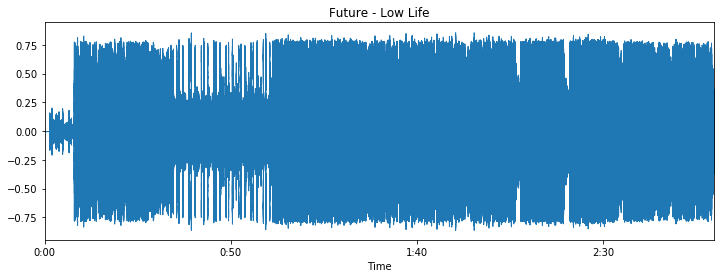

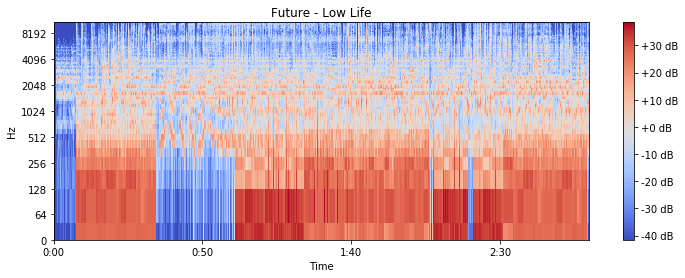

In [4]:
# Waveforms
low, sr1 = librosa.load(low_life, duration=180.0)
plt.figure(figsize=(12,4))
librosa.display.waveplot(low)
plt.title('Future - Low Life')

# Spectogram
low_mel = librosa.feature.melspectrogram(low)
log_mel_low = librosa.power_to_db(low_mel)

# Plotting
plt.figure(figsize=(12,4))
librosa.display.specshow(log_mel_low, y_axis = 'log', x_axis = 'time')
plt.colorbar(format='%+2.0f dB')
plt.title('Future - Low Life')
plt.show()


## Future - Purple Reign

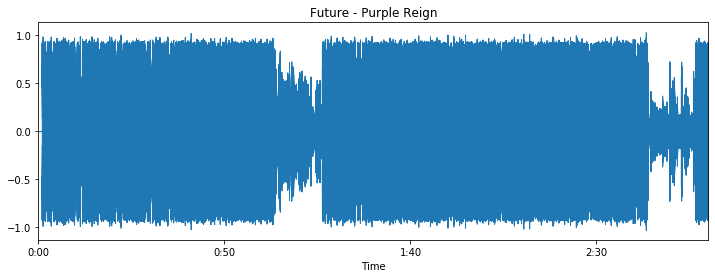

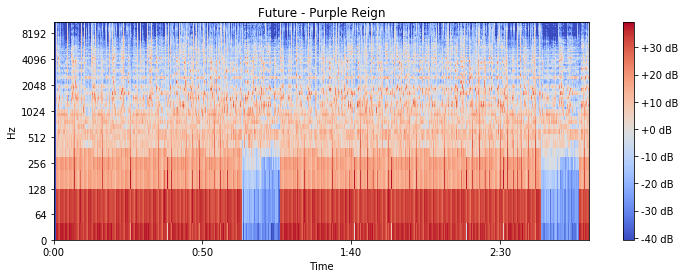

In [5]:
# Future - Purple Reign
purp, sr2 = librosa.load(purple_reign, duration=180.0)
plt.figure(figsize=(12,4))
librosa.display.waveplot(purp)
plt.title('Future - Purple Reign')

# Spectogram
purp_mel = librosa.feature.melspectrogram(purp)
log_mel_purp = librosa.power_to_db(purp_mel)

# Plotting
plt.figure(figsize=(12,4))
librosa.display.specshow(log_mel_purp, y_axis = 'log', x_axis = 'time')
plt.colorbar(format='%+2.0f dB')
plt.title('Future - Purple Reign')
plt.show()


## Future - Life is Good

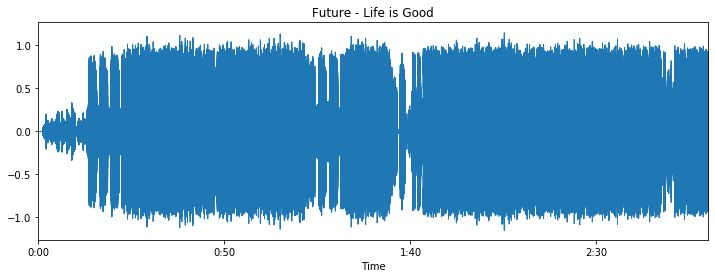

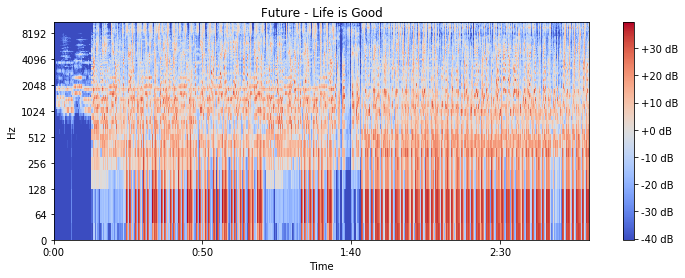

In [6]:
# Future - Life is Good
life, sr3 = librosa.load(life_is_good, duration=180.0)
plt.figure(figsize=(12,4))
librosa.display.waveplot(life)
plt.title('Future - Life is Good')

# Spectogram
life_mel = librosa.feature.melspectrogram(life)
log_mel_life = librosa.power_to_db(life_mel)

# Plotting
plt.figure(figsize=(12,4))
librosa.display.specshow(log_mel_life, y_axis = 'log', x_axis = 'time')
plt.colorbar(format='%+2.0f dB')
plt.title('Future - Life is Good')
plt.show()


## Lady Gaga - Poker Face

'LADY GAGA - POKERFACE'

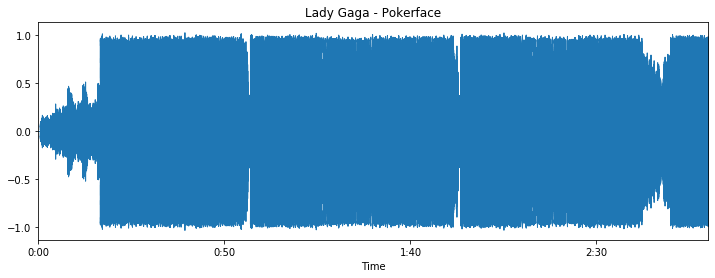

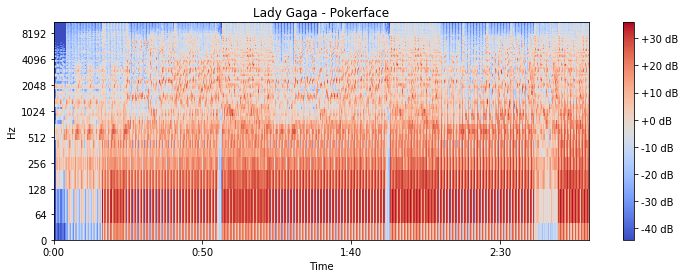

In [7]:
# Lady Gaga - Poker Face
poker, sr4 = librosa.load(pokerface, duration=180.0)
display('LADY GAGA - POKERFACE')
plt.figure(figsize=(12,4))
librosa.display.waveplot(poker)
plt.title('Lady Gaga - Pokerface')

# Spectogram
poker_mel = librosa.feature.melspectrogram(poker)
log_mel_poker = librosa.power_to_db(poker_mel)

# Plotting
plt.figure(figsize=(12,4))
librosa.display.specshow(log_mel_poker, y_axis = 'log', x_axis = 'time')
plt.colorbar(format='%+2.0f dB')
plt.title('Lady Gaga - Pokerface')
plt.show()


## Lady Gaga - Bad Romance


'LADY GAGA - BAD ROMANCE'

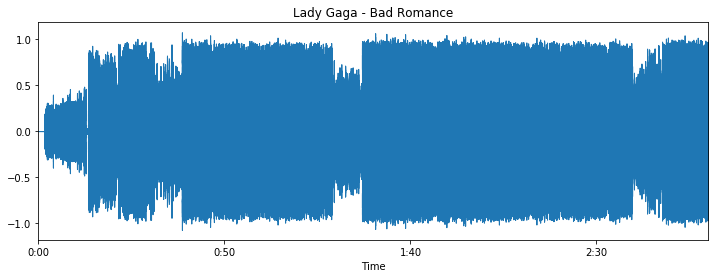

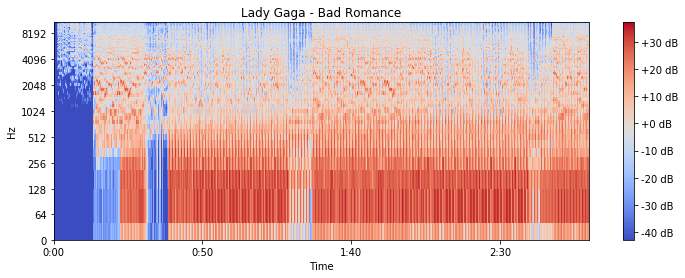

In [8]:
# Lady Gaga - Bad Romance
romance, sr5 = librosa.load(bad_romance, duration=180.0)
display('LADY GAGA - BAD ROMANCE')
plt.figure(figsize=(12,4))
librosa.display.waveplot(romance)
plt.title('Lady Gaga - Bad Romance')

# Spectogram
romance_mel = librosa.feature.melspectrogram(romance)
log_mel_romance = librosa.power_to_db(romance_mel)

# Plotting
plt.figure(figsize=(12,4))
librosa.display.specshow(log_mel_romance, y_axis = 'log', x_axis = 'time')
plt.colorbar(format='%+2.0f dB')
plt.title('Lady Gaga - Bad Romance')
plt.show()

## Lady Gaga - Alejandro

'LADY GAGA - ALEJANDRO'

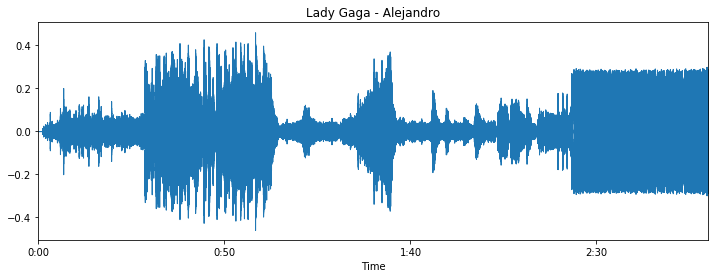

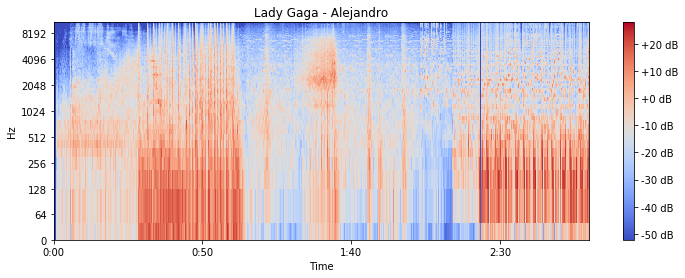

In [23]:
# Lady Gaga - Alejandro
aleja, sr6 = librosa.load(alejandro, duration=180.0)
display('LADY GAGA - ALEJANDRO')
display(IPython.display.Audio(alejandro))
plt.figure(figsize=(12,4))
librosa.display.waveplot(aleja)
plt.title('Lady Gaga - Alejandro')

# Spectogram
ale_mel = librosa.feature.melspectrogram(aleja)
log_mel_ale = librosa.power_to_db(ale_mel)

# Plotting
plt.figure(figsize=(12,4))
librosa.display.specshow(log_mel_ale, y_axis = 'log', x_axis = 'time')
plt.colorbar(format='%+2.0f dB')
plt.title('Lady Gaga - Alejandro')
plt.show()


# Discussion:
After looking at the wave forms, we can begin to recognize similar plots between the two artists. We will test our classifier on two very similar songs between each artists, two very different files that are very different, and two songs under the same discography. Our intention is to gain deeper intuition on our classifier. 

## Similar Pairs
##### Lady Gaga - Pokerface vs. Future - Purple Reign:
We see that these plots have two very distinct dips and as a whole they generally have larger amplitudes. 

## Different Pairs
##### Lady Gaga - Alejandro vs. Future - Low Life:
We see that these plots are largely different. While Lady Gaga's Alejandro is, as a whole, much softer with less sections of large amplitudes, Future's Low Life is much louder with more consistently large amplitudes. 

## Within Artists
#### Lady Gaga: Pokerface vs. Alejandro
These two songs differ greatly in waveforms, therefore we will use this a an easy case for our classifier. 

#### Future: Low Life vs. Life is Good
These two songs are very similiar in waveforms, therefore we will use this as a difficult case for our classifier.

SHAPE:


(25, 7752)

MEAN:


array([-3.72271444e-07, -2.22975345e-07, -4.26393882e-07, -1.04423464e-07,
        3.16153745e-07,  1.85072736e-07, -7.40214006e-08,  1.23884163e-07,
        3.93704369e-07, -6.22434186e-07,  5.01626296e-08, -2.90334299e-07,
       -9.73707870e-09, -1.46858714e-09, -6.41411191e-08,  1.44359802e-07,
        1.65927275e-07, -1.50441750e-07,  1.19301561e-07,  5.24481649e-08,
        3.37590507e-07,  1.00148412e-07, -5.32074473e-09, -3.04727990e-07,
        2.81568902e-07], dtype=float32)

STD:


array([0.99999964, 0.99999946, 0.9999994 , 0.9999989 , 0.9999994 ,
       0.99999994, 1.0000008 , 0.9999998 , 0.9999995 , 0.9999995 ,
       1.0000007 , 1.0000007 , 0.9999996 , 1.0000002 , 0.99999964,
       1.0000013 , 1.0000002 , 0.9999992 , 0.99999815, 1.0000005 ,
       1.0000004 , 0.9999998 , 0.99999905, 1.0000002 , 0.99999934],
      dtype=float32)

SAMPLING:


'SAMPLE SHAPE:'

(431, 25)

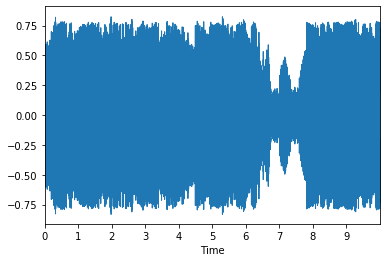

In [46]:
# Future - Low Life

# MFCC
mfcc_low = librosa.feature.mfcc(low, n_mfcc = 25).T
print('SHAPE:')
display(mfcc_low.T.shape)

# Scaling
scaler_low = StandardScaler()
low_scaled = scaler_low.fit(mfcc_low)
mfcc_low_scaled = scaler_low.transform(mfcc_low)

# Verifying
print('MEAN:')
display(mfcc_low_scaled.mean(axis=0))

print('STD:')
display(mfcc_low_scaled.std(axis=0))

# Sampling
print('SAMPLING:')
x_low_test, fs_low = librosa.load(low_life, duration=10, offset = 120)
librosa.display.waveplot(x_low_test)

# MFCC Test
x_low_test_mfcc = librosa.feature.mfcc(x_low_test, n_mfcc=25).T
low_scaled = StandardScaler().fit(x_low_test_mfcc)
mfcc_low_test_scaled = low_scaled.transform(x_low_test_mfcc)
display('SAMPLE SHAPE:', mfcc_low_test_scaled.shape)

SHAPE:


(25, 7752)

MEAN:


array([-7.3552378e-08,  8.1579632e-09, -1.7915225e-09,  9.2590184e-08,
        1.2665218e-07,  1.4227611e-07,  1.0647256e-07,  5.6413736e-08,
       -5.0635499e-08, -3.6657010e-08,  7.5812927e-08, -2.3221361e-07,
       -5.2988312e-08, -9.4097217e-08,  1.9760570e-08, -1.3831054e-07,
       -1.3583278e-07,  2.6033206e-07, -5.2650002e-08, -2.8389479e-08,
       -4.1319389e-08,  6.4310278e-08,  2.2282542e-08, -2.3028369e-08,
       -1.0772202e-08], dtype=float32)

STD:


array([1.0000001 , 1.        , 1.0000005 , 0.9999997 , 1.0000002 ,
       0.9999998 , 0.99999964, 0.99999976, 1.0000004 , 0.99999994,
       1.0000002 , 1.0000004 , 1.0000004 , 0.9999998 , 0.9999998 ,
       1.0000001 , 0.9999992 , 1.0000002 , 1.0000001 , 1.0000001 ,
       0.99999905, 1.0000011 , 1.0000002 , 1.0000002 , 1.        ],
      dtype=float32)

SAMPLING:


'SAMPLE SHAPE:'

(431, 25)

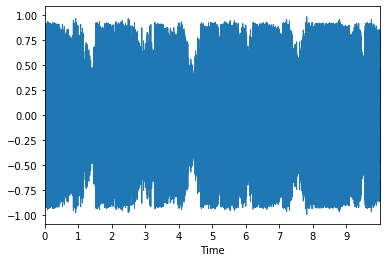

In [47]:
# Future - Purple Reign

# MFCC
mfcc_purp = librosa.feature.mfcc(purp, n_mfcc = 25).T
print('SHAPE:')
display(mfcc_purp.T.shape)

# Scaling
scaler_purp = StandardScaler()
purp_scaled = scaler_purp.fit(mfcc_purp)
mfcc_purp_scaled = scaler_purp.transform(mfcc_purp)

# Verifying
print('MEAN:')
display(mfcc_purp_scaled.mean(axis=0))

print('STD:')
display(mfcc_purp_scaled.std(axis=0))

# Sampling
print('SAMPLING:')
x_purp_test, fs_purp = librosa.load(purple_reign, duration=10, offset = 120)
librosa.display.waveplot(x_purp_test)

# MFCC Test
x_purp_test_mfcc = librosa.feature.mfcc(x_purp_test, n_mfcc=25).T
purp_scaled = StandardScaler().fit(x_purp_test_mfcc)
mfcc_purp_test_scaled = purp_scaled.transform(x_purp_test_mfcc)
display('SAMPLE SHAPE:', mfcc_purp_test_scaled.shape)

SHAPE:


(25, 7752)

MEAN:


array([ 1.47247007e-07,  3.12709112e-08,  1.08129534e-07,  1.02185979e-07,
       -1.48780941e-07,  4.40668401e-07, -1.10935993e-07, -5.13467242e-08,
        1.34925472e-07,  1.97574948e-07, -1.56335318e-07,  2.13195026e-08,
        4.66180303e-08,  3.99055855e-09, -9.70959064e-08, -1.54624530e-07,
        6.33568442e-09,  1.69790972e-08, -5.39763434e-08, -1.70579085e-07,
        5.95585128e-08,  7.70124018e-08,  1.55547202e-08, -8.83997160e-08,
        1.17740704e-07], dtype=float32)

STD:


array([0.99999857, 1.0000007 , 1.0000004 , 0.9999996 , 0.9999995 ,
       1.0000002 , 0.99999964, 0.9999996 , 0.9999993 , 1.0000007 ,
       0.9999994 , 1.        , 0.99999976, 0.99999964, 1.0000001 ,
       0.99999976, 0.9999991 , 1.0000001 , 1.0000007 , 1.0000002 ,
       1.        , 0.99999964, 0.99999976, 1.000001  , 0.9999998 ],
      dtype=float32)

SAMPLING:


'SAMPLE SHAPE:'

(431, 25)

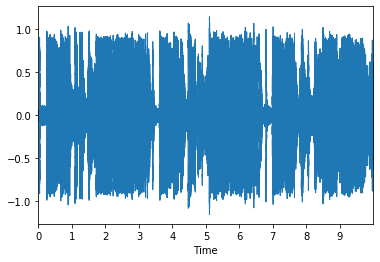

In [48]:
# Future - Life is Good

# MFCC
mfcc_life = librosa.feature.mfcc(life, n_mfcc = 25).T
print('SHAPE:')
display(mfcc_life.T.shape)

# Scaling
scaler_life = StandardScaler()
life_scaled = scaler_life.fit(mfcc_life)
mfcc_life_scaled = scaler_life.transform(mfcc_life)

# Verifying
print('MEAN:')
display(mfcc_life_scaled.mean(axis=0))

print('STD:')
display(mfcc_life_scaled.std(axis=0))  

# Sampling
print('SAMPLING:')
x_life_test, fs_life = librosa.load(life_is_good, duration=10, offset = 120)
librosa.display.waveplot(x_life_test)

# MFCC Test
x_life_test_mfcc = librosa.feature.mfcc(x_life_test, n_mfcc=25).T
life_scaled = StandardScaler().fit(x_life_test_mfcc)
mfcc_life_test_scaled = life_scaled.transform(x_life_test_mfcc)
display('SAMPLE SHAPE:', mfcc_life_test_scaled.shape)

SHAPE:


(25, 7752)

MEAN:


array([-8.28252382e-08,  7.90961039e-08, -1.75615344e-08,  1.54893645e-08,
       -1.28266862e-07,  6.02197616e-08,  7.26143270e-08, -1.19455336e-07,
       -1.14180727e-08,  1.24806832e-07,  5.35534497e-08,  1.86072295e-08,
       -6.57865513e-08,  1.13438745e-07,  9.36512645e-09, -2.16366711e-08,
       -4.70562966e-09,  1.42168455e-08, -1.44552024e-08, -2.31498532e-07,
        7.22760118e-09,  1.16275963e-07,  1.17317811e-07, -5.86281494e-08,
        8.93108520e-08], dtype=float32)

STD:


array([0.99999946, 0.9999994 , 0.99999976, 1.0000004 , 1.0000004 ,
       0.99999934, 0.99999994, 0.9999999 , 1.0000001 , 1.0000004 ,
       1.0000007 , 0.9999995 , 1.0000008 , 0.9999998 , 1.0000002 ,
       0.99999934, 1.0000002 , 1.0000004 , 0.99999905, 1.0000006 ,
       0.99999934, 1.0000001 , 0.99999994, 0.9999999 , 0.99999994],
      dtype=float32)

SAMPLING:


'SAMPLE SHAPE:'

(431, 25)

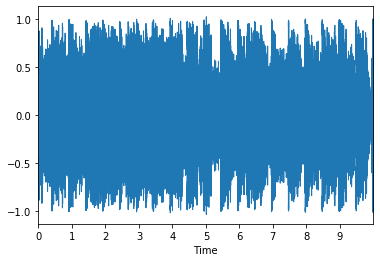

In [49]:
# Lady Gaga - Pokerface

# MFCC
mfcc_poker = librosa.feature.mfcc(poker, n_mfcc = 25).T
print('SHAPE:')
display(mfcc_poker.T.shape)

# Scaling
scaler_poker = StandardScaler()
poker_scaled = scaler_poker.fit(mfcc_poker)
mfcc_poker_scaled = scaler_poker.transform(mfcc_poker)

# Verifying
print('MEAN:')
display(mfcc_poker_scaled.mean(axis=0))

print('STD:')
display(mfcc_poker_scaled.std(axis=0))

# Sampling
print('SAMPLING:')
x_poker_test, fs_poker = librosa.load(pokerface, duration=10, offset = 120)
librosa.display.waveplot(x_poker_test)

# MFCC Test
x_poker_test_mfcc = librosa.feature.mfcc(x_poker_test, n_mfcc=25).T
poker_scaled = StandardScaler().fit(x_poker_test_mfcc)
mfcc_poker_test_scaled = poker_scaled.transform(x_poker_test_mfcc)
display('SAMPLE SHAPE:', mfcc_poker_test_scaled.shape)

SHAPE:


(25, 7752)

MEAN:


array([ 3.6533987e-07,  3.5919832e-08, -3.9326611e-07,  2.5222792e-07,
       -1.4824272e-08,  2.4180170e-07, -1.3896985e-07,  2.5983996e-07,
        5.2930648e-08,  5.7511716e-07, -2.1998436e-07,  6.5713508e-08,
       -1.3085803e-07,  1.8764084e-07,  7.0130802e-08, -1.6325153e-07,
       -4.4347871e-08,  2.0682474e-07,  2.3760931e-07, -8.4624446e-08,
       -3.3954350e-08,  1.4347558e-08,  2.0913911e-08, -7.3967579e-09,
       -1.4101512e-08], dtype=float32)

STD:


array([1.0000005 , 0.9999994 , 1.        , 0.9999993 , 1.0000001 ,
       1.0000008 , 1.0000005 , 0.99999976, 0.99999934, 0.99999887,
       1.        , 0.9999988 , 0.99999994, 0.99999964, 0.99999976,
       0.9999992 , 0.99999946, 0.99999976, 0.99999934, 0.9999997 ,
       1.        , 0.999999  , 1.0000006 , 0.99999964, 1.        ],
      dtype=float32)

SAMPLING:


'SAMPLE SHAPE:'

(431, 25)

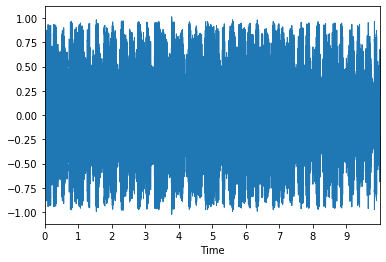

In [50]:
# Lady Gaga - Bad Romance

# MFCC
mfcc_romance = librosa.feature.mfcc(romance, n_mfcc = 25).T
print('SHAPE:')
display(mfcc_romance.T.shape)

# Scaling
scaler_romance = StandardScaler()
romance_scaled = scaler_romance.fit(mfcc_romance)
mfcc_romance_scaled = scaler_romance.transform(mfcc_romance)

# Verifying
print('MEAN:')
display(mfcc_romance_scaled.mean(axis=0))

print('STD:')
display(mfcc_romance_scaled.std(axis=0))

# Sampling
print('SAMPLING:')
x_roma_test, fs_roma = librosa.load(bad_romance, duration=10, offset = 120)
librosa.display.waveplot(x_roma_test)

# MFCC Test
x_roma_test_mfcc = librosa.feature.mfcc(x_roma_test, n_mfcc=25).T
roma_scaled = StandardScaler().fit(x_roma_test_mfcc)
mfcc_roma_test_scaled = roma_scaled.transform(x_roma_test_mfcc)
display('SAMPLE SHAPE:', mfcc_roma_test_scaled.shape)

SHAPE:


(25, 7752)

MEAN:


array([ 1.67957154e-07,  1.10063297e-07,  3.51542070e-07,  2.68174773e-07,
       -1.67741860e-07, -7.73122650e-08,  3.67984882e-07, -1.66427057e-07,
       -1.49319163e-07,  9.46969578e-08, -1.59853016e-07, -7.69508901e-08,
       -1.43068064e-07,  1.36163393e-07, -2.76330816e-08, -1.11606852e-07,
       -1.68445400e-08,  9.07304241e-08, -2.22348703e-07, -6.13884765e-08,
        3.51999567e-08,  1.13427205e-07,  1.48634854e-07, -8.23677482e-08,
        3.45459163e-08], dtype=float32)

STD:


array([0.99999857, 0.99999976, 0.9999996 , 0.99999964, 1.0000004 ,
       0.99999946, 0.9999999 , 0.99999994, 0.99999934, 1.0000007 ,
       0.9999997 , 0.99999964, 0.9999994 , 0.9999997 , 0.9999998 ,
       1.        , 1.0000005 , 0.9999994 , 0.99999946, 0.9999983 ,
       1.0000001 , 1.0000008 , 0.99999946, 1.0000002 , 0.9999993 ],
      dtype=float32)

SAMPLING:


'SAMPLE SHAPE:'

(431, 25)

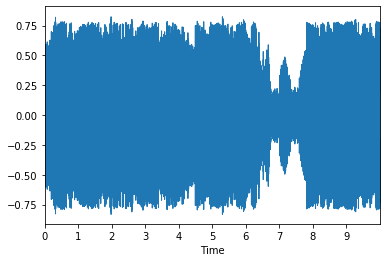

In [51]:
# Lady Gaga - Alejandro 

# MFCC
mfcc_aleja = librosa.feature.mfcc(aleja, n_mfcc = 25).T
print('SHAPE:')
display(mfcc_aleja.T.shape)

# Scaling
scaler_aleja = StandardScaler()
aleja_scaled = scaler_aleja.fit(mfcc_aleja)
mfcc_aleja_scaled = scaler_aleja.transform(mfcc_aleja)

# Verifying
print('MEAN:')
display(mfcc_aleja_scaled.mean(axis=0))

print('STD:')
display(mfcc_aleja_scaled.std(axis=0))

# Sampling
print('SAMPLING:')
x_aleja_test, fs_aleja = librosa.load(low_life, duration=10, offset = 120)
librosa.display.waveplot(x_aleja_test)

# MFCC Test
x_aleja_test_mfcc = librosa.feature.mfcc(x_aleja_test, n_mfcc=25).T
aleja_scaled = StandardScaler().fit(x_aleja_test_mfcc)
mfcc_aleja_test_scaled = aleja_scaled.transform(x_aleja_test_mfcc)
display('SAMPLE SHAPE:', mfcc_aleja_test_scaled.shape)

## Lady Gaga - Pokerface vs. Future - Purple Reign (Similar Pairs)

In [52]:
# Training 
features1 = np.vstack((mfcc_poker_scaled, mfcc_purp_scaled))

# Ground Truth
labels1 = np.concatenate((np.zeros(len(mfcc_poker_scaled)), np.ones(len(mfcc_purp_scaled))))

# Modeling
model1 = sklearn.svm.SVC()
SVC = model1.fit(features1, labels1)

# Prediciting
test_feat1 = np.vstack((mfcc_poker_test_scaled, mfcc_purp_test_scaled))
test_labels1 = np.concatenate(
    (np.zeros(len(mfcc_poker_test_scaled)), np.ones(len(mfcc_purp_test_scaled)))
)

pred_feat1 = model1.predict(test_feat1)

# Evaluating
score1 = model1.score(test_feat1, test_labels1)
print('Accuracy: ', score1)

Accuracy:  0.9651972157772621


# Discussion ...


## Lady Gaga - Alejandro vs. Future - Low Life (Different Pairs)

In [55]:
# Training 
features2 = np.vstack((mfcc_aleja_scaled, mfcc_life_scaled))

# Ground Truth
labels2 = np.concatenate((np.zeros(len(mfcc_aleja_scaled)), np.ones(len(mfcc_life_scaled))))

# Modeling
model2 = sklearn.svm.SVC()
SVC2 = model2.fit(features2, labels2)

# Prediciting
test_feat2 = np.vstack((mfcc_aleja_test_scaled, mfcc_life_test_scaled))
test_labels2 = np.concatenate(
    (np.zeros(len(mfcc_aleja_test_scaled)), np.ones(len(mfcc_life_test_scaled)))
)

pred_feat2 = model2.predict(test_feat2)

# Evaluating
score2 = model2.score(test_feat2, test_labels2)
print('Accuracy: ', score2)

Accuracy:  0.7180974477958236


# Discussion ... 

## Lady Gaga: Pokerface vs. Alejandro (Within Artist)

In [57]:
# Training 
features3 = np.vstack((mfcc_poker_scaled, mfcc_aleja_scaled))

# Ground Truth
labels3 = np.concatenate((np.zeros(len(mfcc_poker_scaled)), np.ones(len(mfcc_aleja_scaled))))

# Modeling
model3 = sklearn.svm.SVC()
SVC3 = model3.fit(features3, labels3)

# Prediciting
test_feat3 = np.vstack((mfcc_poker_test_scaled, mfcc_aleja_test_scaled))
test_labels3 = np.concatenate(
    (np.zeros(len(mfcc_poker_test_scaled)), np.ones(len(mfcc_aleja_test_scaled)))
)

pred_feat3 = model3.predict(test_feat3)

# Evaluating
score3 = model3.score(test_feat3, test_labels3)
print('Accuracy: ', score3)

Accuracy:  0.6925754060324826


# Discussion ... 

This accuracy is relatively low, which is what we expected out of a pop artist, as our initial hypothesis was that that the classifier would struggle in differentiating songs by a pop artist due to the perceived simplicity. Lady Gaga's music was fairly formulaic as well, which was another thing that we expected initially.

## Future: Low Life vs. Life is Good (Within Artist)

In [58]:
# Training 
features4 = np.vstack((mfcc_low_scaled, mfcc_life_scaled))

# Ground Truth
labels4 = np.concatenate((np.zeros(len(mfcc_low_scaled)), np.ones(len(mfcc_life_scaled))))

# Modeling
model4 = sklearn.svm.SVC()
SVC4 = model4.fit(features4, labels4)

# Prediciting
test_feat4 = np.vstack((mfcc_low_test_scaled, mfcc_life_test_scaled))
test_labels4 = np.concatenate(
    (np.zeros(len(mfcc_low_test_scaled)), np.ones(len(mfcc_life_test_scaled)))
)

pred_feat4 = model4.predict(test_feat4)

# Evaluating
score4 = model4.score(test_feat4, test_labels4)
print('Accuracy: ', score4)

Accuracy:  0.7761020881670534


# Discussion ... 

These results conform with what we initially thought that the classifier would struggle more with songs by a specific pop artist than a specific hip hop artist, but not convincingly. I think it shows that the classifier isn't a very steady method of quantifying the differentiation in songs because it only relies on sound and timbre, which are only a couple ways of measuring quantifiable measures in songs. On the whole, the Future songs tended to have a more formulaic sense based on the waveplots, which isn't something we expected from a hip hop artist.